In [93]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, date
import plotly.express as px
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss, ccf
from math import ceil
from os import listdir
from os.path import isfile, join
from scipy.stats import shapiro
import scipy.stats as stats
import holidays
from sklearn.feature_selection import mutual_info_regression

pd.set_option('display.max_rows', 1000)

In [69]:
def plot_weather_features(df, feature, cities):
    fig, axs = plt.subplots(ceil(len(cities) / 2), 2, figsize=(10, 6))

    for i, city in enumerate(cities):
        df[df['city_name'] == city].plot(y= feature, ax=axs[i // 2, i % 2], title=f'{city} {feature}')
        axs[i // 2, i % 2].get_legend().remove()

    plt.tight_layout()

## Energy Data

In [94]:
df_names = [    
    "day_ahead_prices",
    "load",
    "generation",
    "crossborder_flow_net",
    "imports",
    "load_forecast",
    "generation_forecast",
    "wind_solar_forecast",
]

dfs = {}

for df_name in df_names:
    dfs[df_name] = pd.read_csv(f".\\data\\{df_name}_NL.csv") 
    dfs[df_name]["datetime"] = pd.to_datetime(dfs[df_name]["datetime"], utc=True).dt.tz_localize(None)
    dfs[df_name] = dfs[df_name].sort_values('datetime')


In [71]:
def data_quality_check(df):
    sampfreqsec_2_str = {
        900:"15min",
        1800:"30min",
        3600:"1h",
    }
        
    df = df.copy()
    
    n_dup = df.duplicated().sum()
    print(f"Number of duplicated rows = {n_dup}\n")
    
    if n_dup > 0:
        print(df[df.duplicated()])
        df = df.drop_duplicates()
        print("")
        print(f"Number of duplicated rows post removal = {df.duplicated().sum()}\n")
    
    n_df_pre_reindex = len(df)
    sampfreqsec = df["datetime"].diff()[1:].describe()['50%'].seconds
    new_index = pd.date_range(df['datetime'].min(), df['datetime'].max(),freq=sampfreqsec_2_str[sampfreqsec])
    n_new_index = len(new_index)
    
    print(f"Data sampling frequency = {sampfreqsec_2_str[sampfreqsec]}")    
    print("")
    
    df = df.set_index("datetime")
    
    if n_df_pre_reindex != n_new_index:
        # Missing data entries, need to reindex
        print(f"{n_new_index-n_df_pre_reindex} missing values, reindexing")
        df = df.reindex(new_index)

    print("% Nulls in data")    
    print((100 * df.isna().sum() / n_new_index).round(1))
    print("")
    
    print("% Zeros in data")
    print((100 * (df == 0).sum() / n_new_index).round(1))
    print("")

    return df

def clean_en_data(df, df_name):
    sampfreqsec_2_str = {
        900:"15min",
        1800:"30min",
        3600:"1h",
    }
        
    df = df.copy()
    
    n_dup = df.duplicated().sum()
        
    if n_dup > 0:
        df = df.drop_duplicates()
    
    n_df_pre_reindex = len(df)
    sampfreqsec = df["datetime"].diff()[1:].describe()['50%'].seconds
    new_index = pd.date_range(df['datetime'].min(), df['datetime'].max(),freq=sampfreqsec_2_str[sampfreqsec])
    n_new_index = len(new_index)   
    df = df.set_index("datetime")
    
    if n_df_pre_reindex != n_new_index:
        # Missing data entries, need to reindex
        df = df.reindex(new_index)

    if sampfreqsec_2_str[sampfreqsec] != "1h":
        if df_name == "generation_forecast":
            df = df.resample('1h',closed='right', label='right').mean()
        else:
            df = df.resample('1h',closed='right', label='right').sum()
        
    return df

def generate_calendar_features(df):
    df = df.copy()
    print("Adding Calendar Features")
    df["hour_of_day"] = df["datetime"].dt.hour
    df["day_of_week"] = df["datetime"].dt.dayofweek
    df["weekend"] = np.where((df["day_of_week"] == 5) | (df["day_of_week"] == 6), 1, 0)
    df["month"] = df["datetime"].dt.month
    # add variables for holidays
    nl_holidays = holidays.NL() 
    df["holiday"] = df["datetime"].dt.date.apply(lambda x: nl_holidays.get(x)).values
    df["is_holiday"] = np.where(df["holiday"].isna(), 0, 1)
    df = pd.get_dummies(df, columns=["holiday"], dummy_na=False)
    holiday_cols = [col for col in df.columns if "holiday_" in col]
    for col in holiday_cols:
        df[col] = np.where(df[col], 1, 0)
    
    return df

def AB_Test(dataframe, group, target):
    
    # Packages
    from scipy.stats import shapiro
    import scipy.stats as stats
    
    # Split A/B
    holiday_month = dataframe[dataframe[group] == 1]['month'].unique()[0]
    groupA = dataframe[dataframe[group] == 1][target]
    groupB = dataframe[(dataframe["is_holiday"] == 0) & (dataframe["month"] == holiday_month)][target]
    
    # Assumption: Normality
    ntA = shapiro(groupA)[1] < 0.05
    ntB = shapiro(groupB)[1] < 0.05
    # H0: Distribution is Normal! - False
    # H1: Distribution is not Normal! - True
    
    if (ntA == False) & (ntB == False): # "H0: Normal Distribution"
        # Parametric Test
        # Assumption: Homogeneity of variances
        leveneTest = stats.levene(groupA, groupB)[1] < 0.05
        # H0: Homogeneity: False
        # H1: Heterogeneous: True
        
        if leveneTest == False:
            # Homogeneity
            ttest = stats.ttest_ind(groupA, groupB, equal_var=True)[1]
            # H0: M1 == M2 - False
            # H1: M1 != M2 - True
        else:
            # Heterogeneous
            ttest = stats.ttest_ind(groupA, groupB, equal_var=False)[1]
            # H0: M1 == M2 - False
            # H1: M1 != M2 - True
    else:
        # Non-Parametric Test
        ttest = stats.mannwhitneyu(groupA, groupB)[1] 
        # H0: M1 == M2 - False
        # H1: M1 != M2 - True
        
    # Result
    temp = pd.DataFrame({
        "AB Hypothesis":[ttest < 0.05], 
        "p-value":[ttest]
    })
    temp["Test Type"] = np.where((ntA == False) & (ntB == False), "Parametric", "Non-Parametric")
    temp["AB Hypothesis"] = np.where(temp["AB Hypothesis"] == False, "Fail to Reject H0", "Reject H0")
    temp["Comment"] = np.where(temp["AB Hypothesis"] == "Fail to Reject H0", "A/B groups are similar", "A/B groups are not similar")
    temp["Feature"] = group
    temp["GroupA_mean"] = groupA.mean()
    temp["GroupB_mean"] = groupB.mean()
    temp["GroupA_median"] = groupA.median()
    temp["GroupB_median"] = groupB.median()
    
    # Columns
    if (ntA == False) & (ntB == False):
        temp["Homogeneity"] = np.where(leveneTest == False, "Yes", "No")
        temp = temp[["Feature","Test Type", "Homogeneity","AB Hypothesis", "p-value", "Comment", "GroupA_mean", "GroupB_mean", "GroupA_median", "GroupB_median"]]
    else:
        temp = temp[["Feature","Test Type","AB Hypothesis", "p-value", "Comment", "GroupA_mean", "GroupB_mean", "GroupA_median", "GroupB_median"]]
    
    # Print Hypothesis
    # print("# A/B Testing Hypothesis")
    # print("H0: A == B")
    # print("H1: A != B", "\n")
    
    return temp

def generate_lagged_features(df, features, lags):
    lagged_data = []
    for feature in features:
        for lag in lags:
            # df[f'{feature}_lag_{lag}'] = df[feature].shift(lag)
            lagged_data.append(df[feature].shift(lag))
            lagged_data[-1].name = f'{feature}_lag_{lag}'

    df = pd.concat([df] + lagged_data, axis=1)

    return df.copy()

In [95]:
for df_name in df_names:
    print("#" * 10)
    print("")
    print(df_name)
    print("")
    dfs[df_name] = data_quality_check(dfs[df_name])

##########

day_ahead_prices

Number of duplicated rows = 1

        datetime  day_ahead_prices
17545 2022-01-01             124.7

Number of duplicated rows post removal = 0

Data sampling frequency = 1h

% Nulls in data
day_ahead_prices    0.0
dtype: float64

% Zeros in data
day_ahead_prices    0.3
dtype: float64

##########

load

Number of duplicated rows = 0

Data sampling frequency = 15min

% Nulls in data
Actual Load    0.0
dtype: float64

% Zeros in data
Actual Load    0.0
dtype: float64

##########

generation

Number of duplicated rows = 0

Data sampling frequency = 15min

% Nulls in data
Biomass                            0.0
Fossil Gas                         0.0
Fossil Hard coal                   0.0
Hydro Run-of-river and poundage    0.0
Nuclear                            0.0
Other                              0.0
Solar                              0.0
Waste                              0.0
Wind Offshore                      0.0
Wind Onshore                       0.0
dtyp

In [96]:
# remove Hydro Run-of-river and poundage from generation. Generate a total column and add "generation" to column names
dfs["generation"] = dfs["generation"].drop('Hydro Run-of-river and poundage', axis=1)
# Add generation prefix to generation adn wind_solar_forecast columns
dfs["generation"] = dfs["generation"].add_prefix("generation_")
dfs["wind_solar_forecast"] = dfs["wind_solar_forecast"].add_prefix("generation_forecast_")


# resample load, generation, imports
df_names = [    
    "load",
    "generation",
    "imports",
    "load_forecast",
    "generation_forecast",
    "wind_solar_forecast",
    
]

for df_name in df_names:
    
    if df_name == "generation_forecast":
        dfs[df_name] = dfs[df_name].resample('1h',closed='right', label='right').mean()
    else:
        dfs[df_name] = dfs[df_name].resample('1h',closed='right', label='right').sum()
    
    print("#" * 10)
    print(df_name)
    
    n = len(dfs[df_name])
    
    print("% Nulls in data")    
    print(100 * dfs[df_name].isna().sum() / n)
    print("")
    
    print("% Zeros in data")
    print(100 * (dfs[df_name] == 0).sum() / n)
    print("")

##########
load
% Nulls in data
Actual Load    0.0
dtype: float64

% Zeros in data
Actual Load    0.0
dtype: float64

##########
generation
% Nulls in data
generation_Biomass             0.0
generation_Fossil Gas          0.0
generation_Fossil Hard coal    0.0
generation_Nuclear             0.0
generation_Other               0.0
generation_Solar               0.0
generation_Waste               0.0
generation_Wind Offshore       0.0
generation_Wind Onshore        0.0
dtype: float64

% Zeros in data
generation_Biomass              5.208193
generation_Fossil Gas           0.000000
generation_Fossil Hard coal     0.000000
generation_Nuclear              2.345036
generation_Other                0.005397
generation_Solar               13.230969
generation_Waste                0.000000
generation_Wind Offshore        0.021588
generation_Wind Onshore         0.008096
dtype: float64

##########
imports
% Nulls in data
imports    0.0
dtype: float64

% Zeros in data
imports    1.308795
dtype: flo

In [97]:
df_names = [    
    "day_ahead_prices",
    "load",
    "generation",
    "crossborder_flow_net",
    "imports",
    "load_forecast",
    "generation_forecast",
    "wind_solar_forecast",
]

for df_name in df_names:
    print(f"Number of entries in {df_name} = {len(dfs[df_name])}")

Number of entries in day_ahead_prices = 37057
Number of entries in load = 37057
Number of entries in generation = 37057
Number of entries in crossborder_flow_net = 37057
Number of entries in imports = 37057
Number of entries in load_forecast = 37057
Number of entries in generation_forecast = 37057
Number of entries in wind_solar_forecast = 37057


In [98]:
for i, df_name in enumerate(df_names):
    if i == 0:
        df = dfs[df_name].copy()
    else:
        df = pd.merge_asof(df,  dfs[df_name], left_index=True, right_index=True)


In [99]:
gen_names = [    
    "fossil_gas",
    "fossil_hard_coal",
    "nuclear"
]

dfs_unav_gen = {}

for gen_name in gen_names:
    unav_gen_tmp = pd.read_csv( f".\\data\\unavailability_of_generation_units_NL_{gen_name}.csv") 
    unav_gen_tmp["datetime"] = pd.to_datetime(unav_gen_tmp["datetime"], utc=True).dt.tz_localize(None)
    unav_gen_tmp = unav_gen_tmp.sort_values('datetime').set_index('datetime')
    df = pd.merge(df, unav_gen_tmp, left_index=True, how='left', right_index=True)

In [100]:
print("% of Nulls")
print(100 * (df.isna().sum() / len(df)).round(1))
df = df.fillna(0)

% of Nulls
day_ahead_prices                            0.0
Actual Load                                 0.0
generation_Biomass                          0.0
generation_Fossil Gas                       0.0
generation_Fossil Hard coal                 0.0
generation_Nuclear                          0.0
generation_Other                            0.0
generation_Solar                            0.0
generation_Waste                            0.0
generation_Wind Offshore                    0.0
generation_Wind Onshore                     0.0
crossborder_flow_net                        0.0
imports                                     0.0
Forecasted Load                             0.0
generation_forecast                         0.0
generation_forecast_Solar                   0.0
generation_forecast_Wind Offshore           0.0
generation_forecast_Wind Onshore            0.0
generation_fossil_gas_missing_qty           0.0
generation_fossil_hard_coal_missing_qty    20.0
generation_nuclear_missing_qt

In [101]:
# split the data into training and testing sets
n_df = len(df)
df_train = df.iloc[:int(n_df * 0.8),:].copy()
df_test = df.iloc[int(n_df * 0.8) + 100:,:].copy()

print("Number of training obeservations: " + str(len(df_train)))
print("Number of testing obeservations: " + str(len(df_test)))

Number of training obeservations: 29645
Number of testing obeservations: 7312


In [78]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 29645 entries, 2020-01-01 00:00:00 to 2023-05-20 04:00:00
Freq: h
Data columns (total 19 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Actual Load                              29645 non-null  float64
 1   generation_Biomass                       29645 non-null  float64
 2   generation_Fossil Gas                    29645 non-null  float64
 3   generation_Fossil Hard coal              29645 non-null  float64
 4   generation_Nuclear                       29645 non-null  float64
 5   generation_Other                         29645 non-null  float64
 6   generation_Solar                         29645 non-null  float64
 7   generation_Waste                         29645 non-null  float64
 8   generation_Wind Offshore                 29645 non-null  float64
 9   generation_Wind Onshore                  29645 non-null  float64
 10  imp

In [79]:
100 * ((df_train == 0).sum() / len(df_train)).round(1)

Actual Load                                 0.0
generation_Biomass                          0.0
generation_Fossil Gas                       0.0
generation_Fossil Hard coal                 0.0
generation_Nuclear                          0.0
generation_Other                            0.0
generation_Solar                           20.0
generation_Waste                            0.0
generation_Wind Offshore                    0.0
generation_Wind Onshore                     0.0
imports                                     0.0
Forecasted Load                             0.0
generation_forecast                         0.0
generation_forecast_Solar                  40.0
generation_forecast_Wind Offshore           0.0
generation_forecast_Wind Onshore            0.0
generation_fossil_gas_missing_qty           0.0
generation_fossil_hard_coal_missing_qty    20.0
generation_nuclear_missing_qty             90.0
dtype: float64

In [14]:
df_train.describe().round(2).transpose()

,count,mean,std,min,25%,50%,75%,max
day_ahead_prices,29645.0,124.13,117.51,-222.36,38.88,84.01,180.0,871.0
Actual Load,29645.0,47938.35,7695.10,11222.00,42301.00,46862.00,53028.0,71705.0
generation_Biomass,29645.0,69.92,46.57,-16.00,40.00,64.00,90.0,180.0
generation_Fossil Gas,29645.0,18100.75,9899.82,2444.00,8766.00,17043.00,26388.0,42357.0
generation_Fossil Hard coal,29645.0,7907.59,3847.98,-153.00,4662.00,7642.00,11122.0,15603.0
generation_Nuclear,29645.0,1706.40,574.90,-100.00,1864.00,1907.00,1936.0,1961.0
generation_Other,29645.0,9338.09,7953.98,-6343.00,3475.00,8530.00,14356.0,56816.0
generation_Solar,29645.0,174.78,295.28,-5.00,-3.00,4.00,242.0,1654.0
generation_Waste,29645.0,1479.33,189.34,-1789.00,1348.00,1493.00,1615.0,2055.0
generation_Wind Offshore,29645.0,3253.88,2756.40,-135.00,918.00,2545.00,5181.0,10760.0


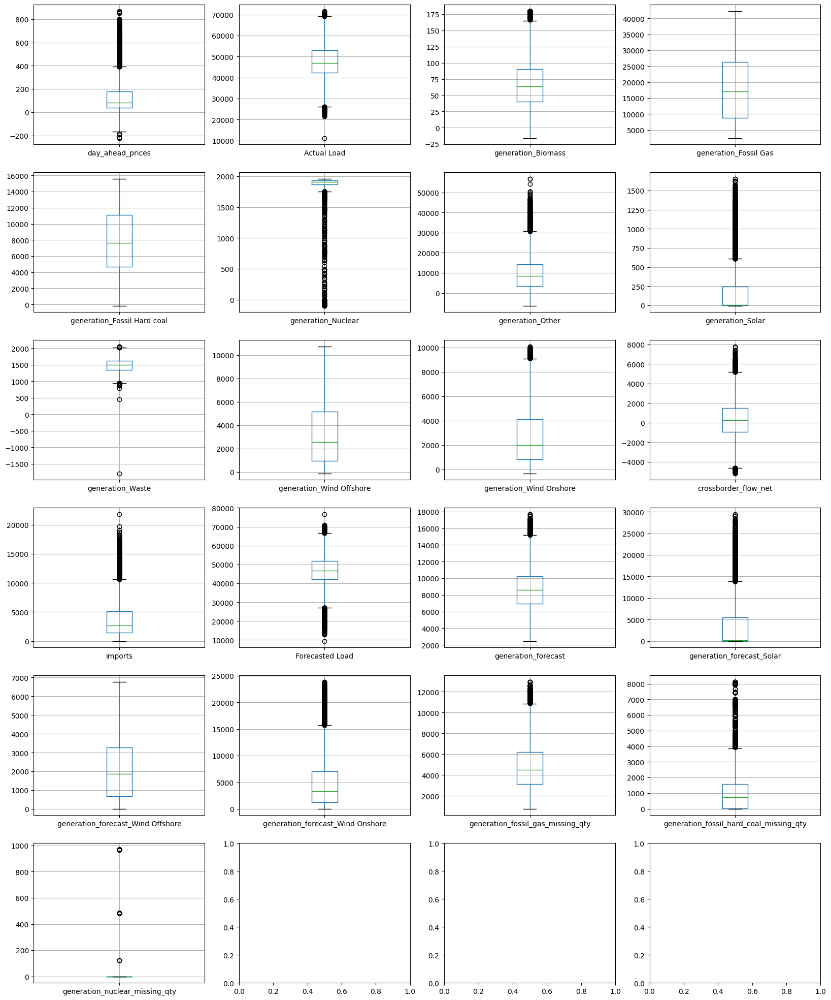

In [15]:
cols = df_train.columns
fig, axs = plt.subplots(ceil(len(cols) / 4), 4, figsize=(20, 25))

for i, col in enumerate(cols):
    df_train.boxplot([col], ax=axs[i // 4, i % 4])


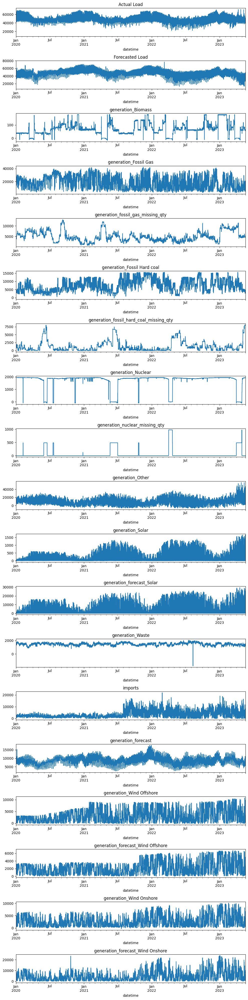

In [16]:
features_2_check = [
    'Actual Load',
    'Forecasted Load',
    'generation_Biomass',
    'generation_Fossil Gas',
    'generation_fossil_gas_missing_qty',
    'generation_Fossil Hard coal',
    'generation_fossil_hard_coal_missing_qty',
    'generation_Nuclear', 
    'generation_nuclear_missing_qty',
    'generation_Other', 
    'generation_Solar',
    'generation_forecast_Solar',
    'generation_Waste', 
    'imports',
    'generation_forecast',
    'generation_Wind Offshore',
    'generation_forecast_Wind Offshore',
    'generation_Wind Onshore',
    'generation_forecast_Wind Onshore'
]

fig, axs = plt.subplots(len(features_2_check),1, figsize=(10, 40))

for i, col in enumerate(features_2_check):
    df_train.plot(y= col, ax=axs[i], title=col)
    axs[i].get_legend().remove()
    
plt.tight_layout()

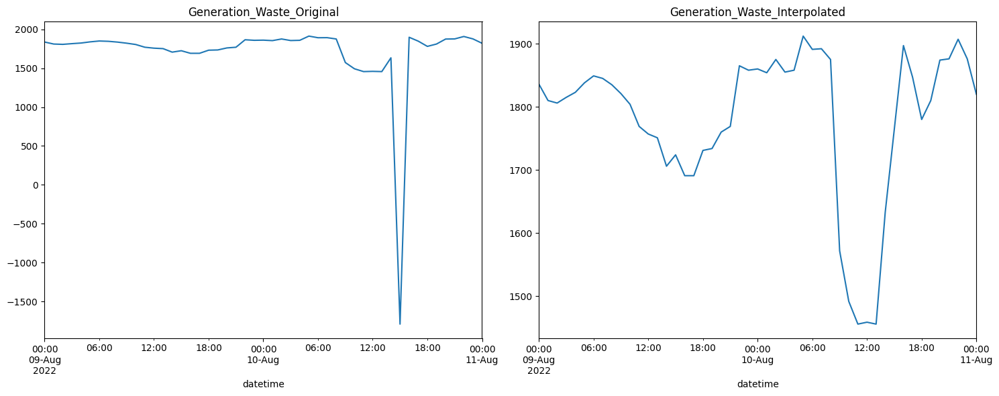

In [102]:
_ind = (df_train.index >= '2022-08-09') & (df_train.index <= '2022-08-11')
gen_waste_before = df_train[_ind]["generation_Waste"]
outlier_ind = df_train[df_train["generation_Waste"] < 0.0].index
df_train.loc[outlier_ind, "generation_Waste"] = np.nan
df_train.interpolate(method='linear', limit_direction='forward', inplace=True)
gen_waste_after = df_train[_ind]["generation_Waste"]

fig, axs = plt.subplots(1,2, figsize=(15, 6))

gen_waste_before.plot(title= "Generation_Waste_Original", ax=axs[0]) 
gen_waste_after.plot(title= "Generation_Waste_Interpolated", ax=axs[1]) 
plt.tight_layout()

In [103]:
# calculate total generation
generation_columns = [col for col in df_train.columns if ("generation_" in col) and ("missing_" not in col)]
df_train["generation_total"] = df_train[generation_columns].sum(axis=1)
en_features = df_train.columns.to_list()

## Weather Data

In [104]:
df_w = pd.read_csv(".\\data\\weather_data_NL.csv")
df_w = df_w.rename(columns={"dt":"datetime"})
df_w["datetime"] = pd.to_datetime(df_w["datetime"], unit='s')
df_w["city_name"] = df_w["city_name"].str.lower()
df_w = df_w[(df_w["datetime"] >= df.index.min()) & (df_w["datetime"] <= df.index.max())].copy()
df_w = df_w.sort_values(['datetime','city_name'])
df_w.iloc[0]

datetime                         2020-01-01 00:00:00
dt_iso                 2020-01-01 00:00:00 +0000 UTC
timezone                                        3600
city_name                                     almere
lat                                        52.350785
lon                                         5.264702
temp                                            3.25
visibility                                       NaN
dew_point                                       2.82
feels_like                                       0.9
temp_min                                         2.2
temp_max                                        3.88
pressure                                        1035
sea_level                                        NaN
grnd_level                                       NaN
humidity                                          97
wind_speed                                      2.42
wind_deg                                         142
wind_gust                                     

In [105]:
cols_2_remove = ['dt_iso', 'timezone', 'lat', 'lon', 'weather_icon']
df_w = df_w.drop(cols_2_remove, axis=1)

cat_features = ['weather_id', 'weather_main', 'weather_description']
num_features = [s for s in df_w.columns if s not in cat_features]

n_dup = df_w.duplicated().sum()
print(f"Number of duplicated rows incl all columns = {n_dup}\n")

Number of duplicated rows incl all columns = 0



In [21]:
df_w.groupby('city_name').size()

city_name
almere       37057
amsterdam    39905
eindhoven    39221
groningen    38985
rotterdam    38394
the hague    39004
utrecht      37057
dtype: int64

In [22]:
n_dup = df_w[num_features].duplicated().sum()
print(f"Number of duplicated rows excl categorical features = {n_dup}\n")

Number of duplicated rows excl categorical features = 10224



In [106]:
df_w[df_w[num_features].duplicated(keep=False)][['datetime', 'city_name', 'weather_id', 'weather_main', 'weather_description']].head(6)

,datetime,city_name,weather_id,weather_main,weather_description
369763,2020-01-01 00:00:00,amsterdam,741,Fog,fog
369764,2020-01-01 00:00:00,amsterdam,711,Smoke,smoke
369771,2020-01-01 07:00:00,amsterdam,741,Fog,fog
369772,2020-01-01 07:00:00,amsterdam,701,Mist,mist
369773,2020-01-01 08:00:00,amsterdam,741,Fog,fog
369774,2020-01-01 08:00:00,amsterdam,701,Mist,mist


In [107]:
df_w = df_w[num_features].drop_duplicates()
df_w.groupby('city_name').size()

city_name
almere       37057
amsterdam    37057
eindhoven    37057
groningen    37057
rotterdam    37057
the hague    37057
utrecht      37057
dtype: int64

In [108]:
print("% Zeros in data")
print(100 *  ((df_w == 0).sum() / len(df_w)).round(1))
print("")

print("% Nulls in data")    
print(100 * (df_w.isna().sum() / len(df_w)).round(1))
print("")

% Zeros in data
datetime       0.0
city_name      0.0
temp           0.0
visibility     0.0
dew_point      0.0
feels_like     0.0
temp_min       0.0
temp_max       0.0
pressure       0.0
sea_level      0.0
grnd_level     0.0
humidity       0.0
wind_speed     0.0
wind_deg       0.0
wind_gust      0.0
rain_1h        0.0
rain_3h        0.0
snow_1h        0.0
snow_3h        0.0
clouds_all    10.0
dtype: float64

% Nulls in data
datetime        0.0
city_name       0.0
temp            0.0
visibility     30.0
dew_point       0.0
feels_like      0.0
temp_min        0.0
temp_max        0.0
pressure        0.0
sea_level     100.0
grnd_level    100.0
humidity        0.0
wind_speed      0.0
wind_deg        0.0
wind_gust      60.0
rain_1h        80.0
rain_3h       100.0
snow_1h       100.0
snow_3h       100.0
clouds_all      0.0
dtype: float64



In [26]:
print("% Nulls by City")    
print(100 * df_w[['visibility', 'wind_gust','rain_1h']].isnull().groupby(df_w['city_name']).sum().div(df_w.groupby('city_name').size(), axis=0).round(1))

% Nulls by City
           visibility  wind_gust  rain_1h
city_name                                
almere          100.0       20.0     80.0
amsterdam         0.0       70.0     70.0
eindhoven         0.0       80.0     80.0
groningen        10.0       80.0     80.0
rotterdam        10.0       80.0     80.0
the hague        10.0       60.0     80.0
utrecht          70.0       40.0     80.0


In [109]:
# remove features with majority null values
cols_2_remove = ['sea_level', 'grnd_level', 'wind_gust', 'rain_1h', 'rain_3h', 'snow_1h', 'snow_3h']
df_w = df_w.drop(cols_2_remove, axis=1)

# Create training weather data
df_w_train = df_w[(df_w["datetime"] >= df_train.index.min()) & (df_w["datetime"] <= df_train.index.max())].copy()
df_w_train = df_w_train.set_index("datetime")
w_features = df_w_train.columns[1:]
w_cities = df_w_train['city_name'].unique()

In [28]:
# Distribution statistics for weather variabes
df_w_train[w_features].describe().transpose().round(1)

,count,mean,std,min,25%,50%,75%,max
temp,207515.0,11.2,6.4,-10.2,6.5,10.6,15.7,38.6
visibility,152036.0,9109.4,2186.7,40.0,10000.0,10000.0,10000.0,10000.0
dew_point,207515.0,7.3,5.5,-47.9,3.2,7.2,11.4,24.5
feels_like,207515.0,9.8,7.5,-16.4,4.0,9.8,15.3,37.6
temp_min,207515.0,10.2,6.3,-12.3,5.5,9.9,14.9,37.9
temp_max,207515.0,12.1,6.4,-9.1,7.2,11.6,16.6,39.2
pressure,207515.0,1016.0,10.5,974.0,1010.0,1017.0,1023.0,1049.0
humidity,207515.0,78.7,14.3,1.0,70.0,82.0,90.0,100.0
wind_speed,207515.0,4.0,2.7,0.0,2.1,3.6,5.1,34.4
wind_deg,207515.0,183.9,97.2,0.0,100.0,200.0,250.0,360.0


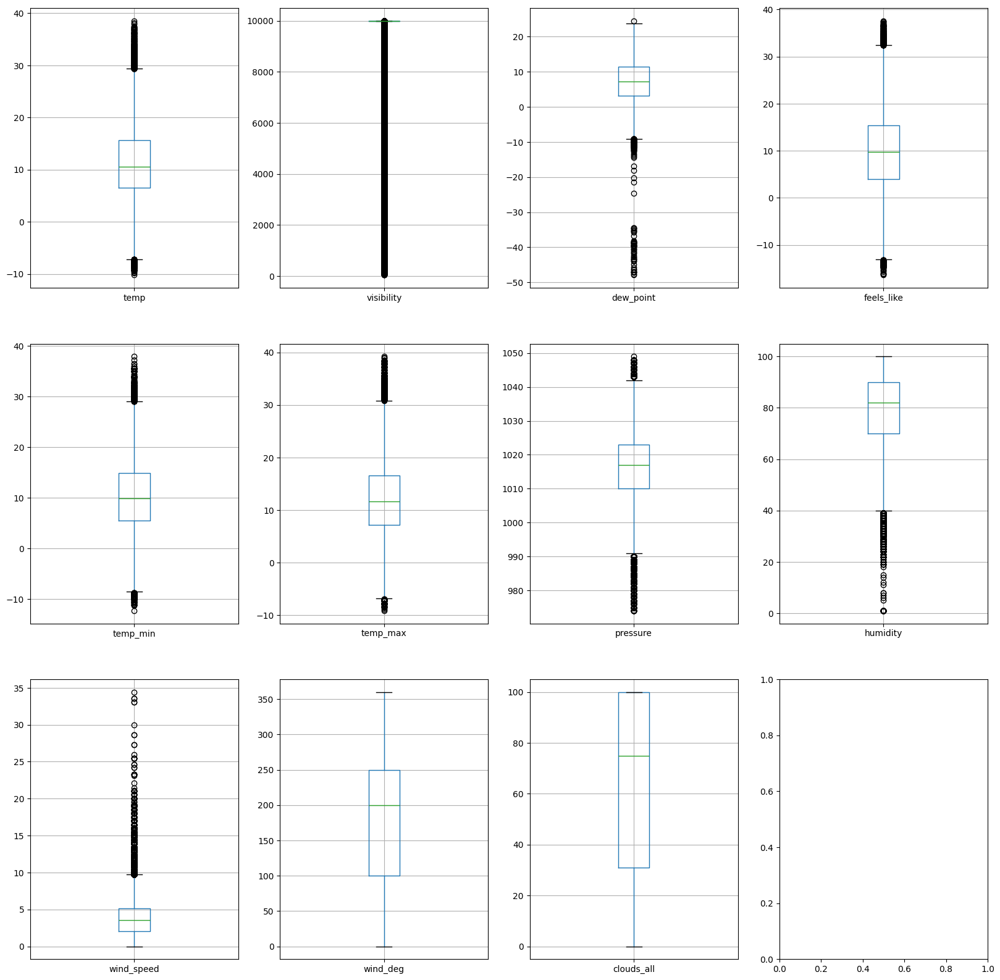

In [29]:
fig, axs = plt.subplots(ceil(len(w_features) / 4), 4, figsize=(20, 20))

for i, w_feature in enumerate(w_features):
    df_w_train.boxplot([w_feature], ax=axs[i // 4, i % 4])

Visibility, dew_point, humidity, wind_speed contain outliers, investigate further

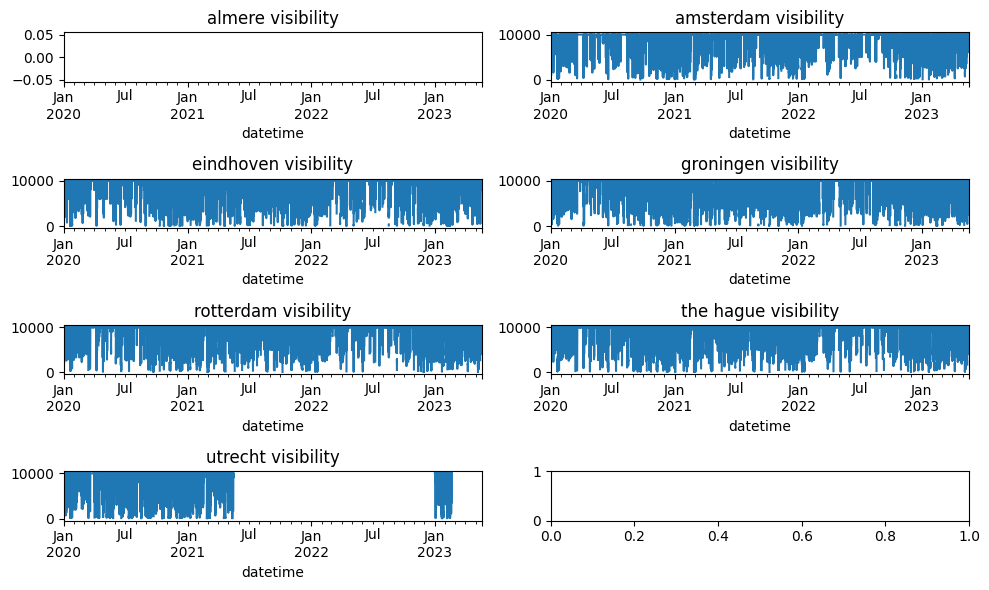

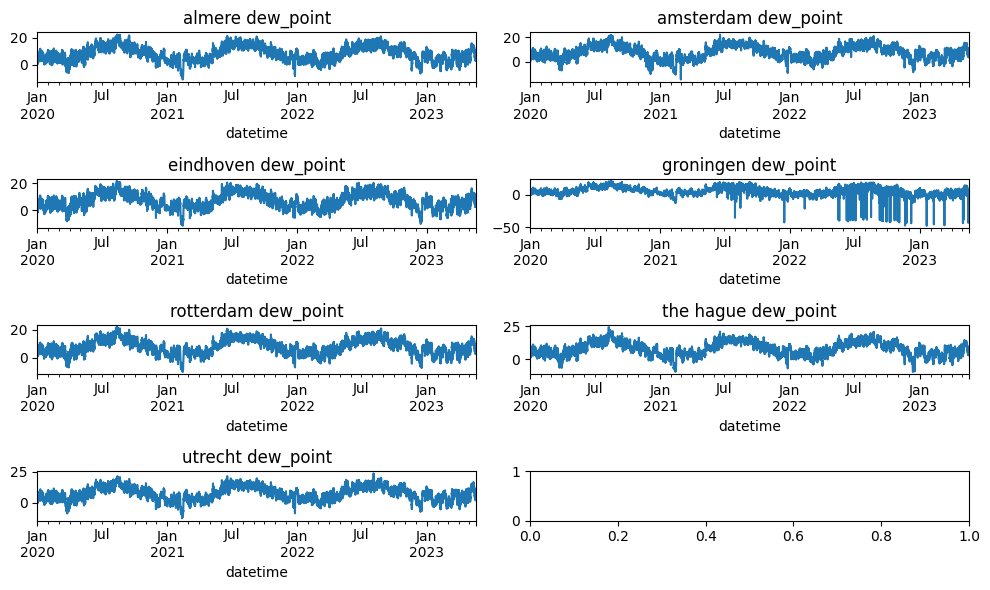

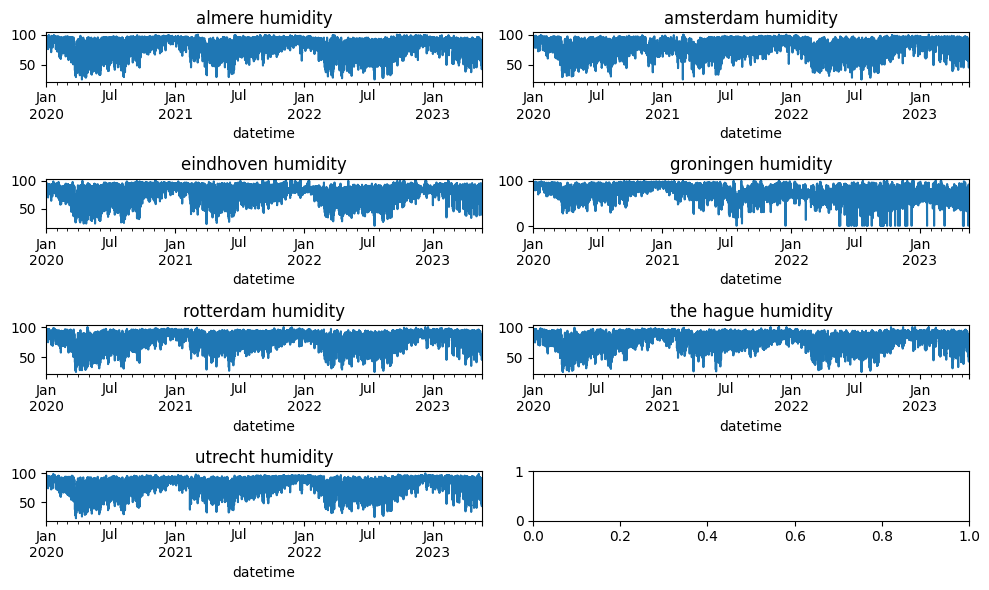

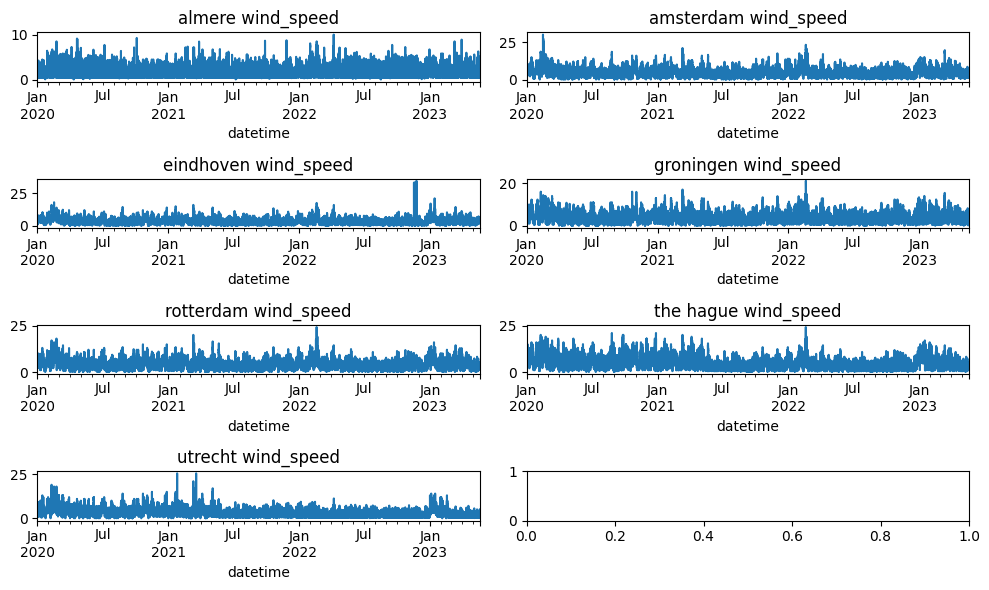

In [30]:
# visibility, dew_point, humidity, wind_speed contain outliers, investigate further

features_2_check = ["visibility", "dew_point", "humidity", "wind_speed"]

for w_feature in features_2_check:
    plot_weather_features(df_w_train, w_feature, w_cities)

In [31]:
# Distribution statistics for visibility, dew_point, humidity, wind_speed

df_w_train.groupby('city_name')[['dew_point','humidity', 'wind_speed']].describe(
    percentiles=[0.001, 0.01, 0.5, 0.99, 0.999]).transpose().round(1)

city_name          almere  amsterdam  eindhoven  groningen  rotterdam  \
dew_point  count  29645.0    29645.0    29645.0    29645.0    29645.0   
           mean       7.8        7.6        7.1        5.5        7.8   
           std        5.4        5.5        5.6        5.8        5.3   
           min      -11.1      -14.2      -11.2      -47.9      -10.2   
           0.1%      -8.8       -8.8       -9.6      -39.4       -8.2   
           1%        -4.5       -4.9       -5.7       -7.3       -4.4   
           50%        7.8        7.6        7.0        5.2        7.8   
           99%       18.9       18.6       18.2       17.7       18.5   
           99.9%     21.2       20.6       20.0       19.9       20.6   
           max       22.2       22.1       21.7       21.6       22.1   
humidity   count  29645.0    29645.0    29645.0    29645.0    29645.0   
           mean      81.5       79.3       77.3       73.2       79.9   
           std       14.0       13.6       15.3       14.8       13.4   
           min       26.0       25.0       19.0        1.0       26.0   
           0.1%      31.0       31.0       25.0        1.0       30.0   
           1%        39.0       40.0       32.0       37.0       39.0   
           50%       86.0       82.0       83.0       73.0       84.0   
           99%       97.0       97.0       97.0       97.0       96.0   
           99.9%     99.0       98.0      100.0      100.0       98.0   
           max      100.0      100.0      100.0      100.0      100.0   
wind_speed count  29645.0    29645.0    29645.0    29645.0    29645.0   
           mean       1.8        5.0        3.8        4.2        4.5   
           std        1.2        2.9        2.2        2.3        2.6   
           min        0.0        0.0        0.0        0.0        0.0   
           0.1%       0.3        0.0        0.0        0.0        0.0   
           1%         0.4        0.5        0.5        0.5        0.5   
           50%        1.6        4.6        3.6        3.6        4.1   
           99%        5.4       14.0       10.8       11.3       12.0   
           99.9%      7.6       19.1       14.0       14.6       15.4   
           max       10.0       30.0       34.4       21.1       24.2   

city_name         the hague  utrecht  
dew_point  count    29645.0  29645.0  
           mean         7.9      7.4  
           std          5.3      5.4  
           min         -9.7    -12.3  
           0.1%        -7.7     -9.2  
           1%          -4.5     -5.1  
           50%          7.8      7.4  
           99%         18.6     18.2  
           99.9%       21.0     20.1  
           max         24.5     23.8  
humidity   count    29645.0  29645.0  
           mean        79.9     79.8  
           std         12.8     14.3  
           min         27.0     22.0  
           0.1%        30.0     29.0  
           1%          40.0     37.0  
           50%         83.0     85.0  
           99%         96.0     96.0  
           99.9%       98.0     97.0  
           max        100.0    100.0  
wind_speed count    29645.0  29645.0  
           mean         5.3      3.5  
           std          3.3      2.4  
           min          0.0      0.0  
           0.1%         0.0      0.0  
           1%           0.4      0.4  
           50%          4.6      3.0  
           99%         15.0     11.0  
           99.9%       19.0     16.0  
           max         24.2     25.5

There was a large increase in wind values from 99.9% to max, and large decrease in dew_point and humidity values from 1% to min, will investigate these values further

In [32]:
# Big increase in wind values from 99.9% to max, check these
df_w_train[df_w_train['wind_speed'] > 20][['city_name', 'wind_speed']]

,city_name,wind_speed
datetime,,
2020-02-15 22:00:00,amsterdam,29.95
2020-02-15 23:00:00,amsterdam,28.61
2020-02-16 03:00:00,amsterdam,27.27
2020-02-16 06:00:00,amsterdam,20.56
2020-02-16 07:00:00,amsterdam,23.25
2020-02-16 08:00:00,amsterdam,20.56
2020-02-16 09:00:00,amsterdam,25.93
2020-02-16 10:00:00,amsterdam,23.25
2020-02-16 11:00:00,amsterdam,21.46


Cross reference dates with weather reports & secondary data sources

1. 2020 Feb: Correct, Storm Dennis https://en.wikipedia.org/wiki/Storm_Dennis
2. 2020 Aug: Correct, The Hague https://weatherspark.com/h/m/51325/2020/8/Historical-Weather-in-August-2020-in-The-Hague-Netherlands
3. 2020 Dec: Correct, The Hague https://weatherspark.com/h/m/51325/2020/8/Historical-Weather-in-August-2020-in-The-Hague-Netherlands
4. 2021 Jan Utrecht: Incorrect, https://weatherspark.com/h/m/52666/2021/1/Historical-Weather-in-January-2021-in-Utrecht-Netherlands#Figures-WindSpeed
5. 2021 March Amsterdam: Correct, https://weatherspark.com/h/m/51381/2021/3/Historical-Weather-in-March-2021-in-Amsterdam-Netherlands
6. 2021 11 March Utrecht: Correct, https://weatherspark.com/h/m/52666/2021/3/Historical-Weather-in-March-2021-in-Utrecht-Netherlands
7. 2021 19 March Utrecht: Incorrect, https://weatherspark.com/h/m/52666/2021/3/Historical-Weather-in-March-2021-in-Utrecht-Netherlands
8. 2022 Feb: Storms Dudley, Eunice and Franklin https://en.wikipedia.org/wiki/2021%E2%80%9322_European_windstorm_season
9. 2022 Nov Eindhoven: Incorrect, https://weatherspark.com/h/m/52616/2022/11/Historical-Weather-in-November-2022-in-Eindhoven-Netherlands
10. 2023 Jan Eindhoven: Incorrect, https://weatherspark.com/h/m/52616/2023/1/Historical-Weather-in-January-2023-in-Eindhoven-Netherlands

In [33]:
# Big decrease in dew_point and humidity values from 1% to min, check these
_ind = (df_w_train['dew_point'] < -15) | (df_w_train['humidity'] < 20)
df_w_train[_ind][['city_name', 'dew_point', 'humidity']]

,city_name,dew_point,humidity
datetime,,,
2021-07-26 04:00:00,groningen,-6.77,19
2021-07-30 16:00:00,groningen,-35.65,1
2021-08-03 04:00:00,groningen,-10.76,19
2021-08-13 22:00:00,groningen,-7.13,19
2021-08-14 22:00:00,groningen,-20.26,6
2021-12-16 08:00:00,groningen,-42.72,1
2022-02-11 21:00:00,groningen,-21.45,14
2022-05-17 03:00:00,groningen,-38.50,1
2022-05-20 04:00:00,groningen,-40.02,1


Humidity of 1 in the netherlands is highly unlikely, the lowest humidity recorded on earth was 0.36% Humidity in Iran and the annual average humidity is around 70%. going to set any humidity values less than 18, and corresponding dew_point values, as null


In [110]:
df_w_train_orig = df_w_train.copy()

ws_u_outlier_ind_1 = (df_w_train['city_name'] == "utrecht") & (df_w_train['wind_speed'] > 21) & (df_w_train.index >= '2021-01-24') & (df_w_train.index <= '2021-01-26')
ws_u_outlier_ind_2 = (df_w_train['city_name'] == "utrecht") & (df_w_train['wind_speed'] > 21) & (df_w_train.index >= '2021-03-10') & (df_w_train.index <= '2021-03-20')
ws_e_outlier_ind_1 = (df_w_train['city_name'] == "eindhoven") & (df_w_train['wind_speed'] > 10) & (df_w_train.index >= '2022-11-16') & (df_w_train.index <= '2022-11-25')
ws_e_outlier_ind_2 = (df_w_train['city_name'] == "eindhoven") & (df_w_train['wind_speed'] > 15) & (df_w_train.index >= '2023-01-13') & (df_w_train.index <= '2023-01-15')
h_outlier_ind = (df_w_train['humidity'] < 18)

df_w_train.loc[ws_u_outlier_ind_1, "wind_speed"] = np.nan
df_w_train.loc[ws_u_outlier_ind_2, "wind_speed"] = np.nan
df_w_train.loc[ws_e_outlier_ind_1, "wind_speed"] = np.nan
df_w_train.loc[ws_e_outlier_ind_2, "wind_speed"] = np.nan
df_w_train.loc[h_outlier_ind, ["dew_point", "humidity"]] = np.nan

for i, city in enumerate(df_w_train["city_name"].unique()):
    temp_df = df_w_train[df_w_train["city_name"] == city].copy()
    temp_df = temp_df.drop("city_name", axis=1)
    temp_df = temp_df.sort_index()
    temp_df = temp_df.add_suffix(f'_{city}')
    if i == 0:
        df_w_train_wide = temp_df
    else:
        df_w_train_wide = pd.merge(df_w_train_wide, temp_df, left_index=True, how='left', right_index=True)

df_w_train_wide = df_w_train_wide.drop(['visibility_almere', 'visibility_utrecht', 'wind_speed_almere', 'wind_deg_almere'], axis=1)        
df_w_train_wide.interpolate(method='linear', limit_direction='forward', inplace=True)    

del df_w_train

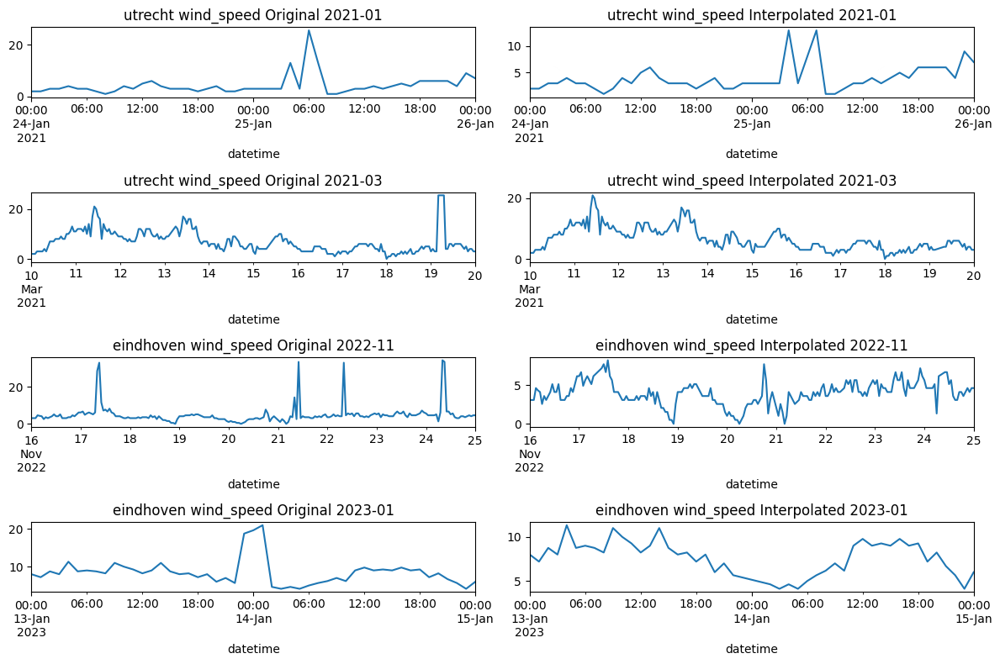

In [35]:
# Plot features before and after interpolation

cities = ["utrecht", "utrecht",
          "eindhoven", "eindhoven"]

dates_list = [['2021-01-24', '2021-01-26'], ['2021-03-10', '2021-03-20'], 
              ['2022-11-16', '2022-11-25'], ['2023-01-13', '2023-01-15']]

fig, axs = plt.subplots(len(cities), 2, figsize=(12, 8))

for i, (city, dates) in enumerate(zip(cities, dates_list)):
    _ind = (df_w_train_orig.index >= dates[0]) & (df_w_train_orig.index <= dates[1]) & (df_w_train_orig['city_name'] == city)
    df_w_train_orig[_ind]['wind_speed'].plot(title= f"{city} wind_speed Original {dates[0][:7]}", ax=axs[i, 0]) 
    _ind = (df_w_train_wide.index >= dates[0]) & (df_w_train_wide.index <= dates[1])
    df_w_train_wide[_ind][f'wind_speed_{city}'].plot(title= f"{city} wind_speed Interpolated {dates[0][:7]}", ax=axs[i, 1]) 
    
plt.tight_layout()

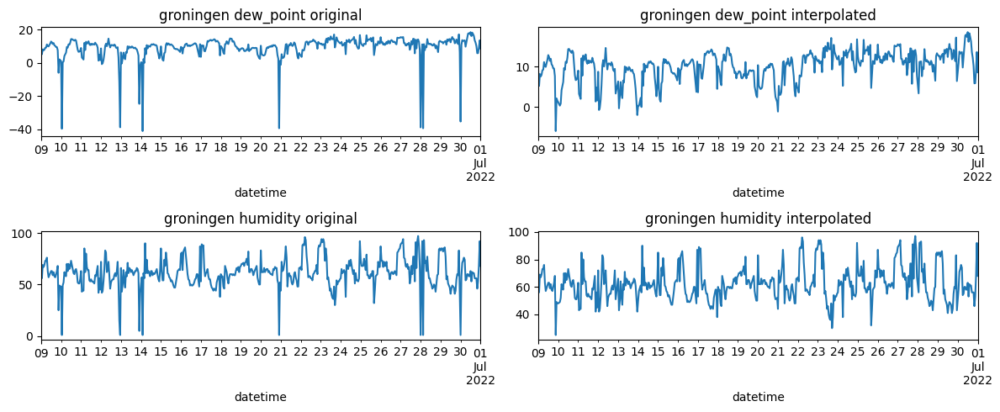

In [36]:
fig, axs = plt.subplots(2, 2, figsize=(12, 5))
                        
city= "groningen"

_ind = (df_w_train_orig.index >= '2022-06-09') & (df_w_train_orig.index <= '2022-07-01') & (df_w_train_orig['city_name'] == city)
df_w_train_orig[_ind]['dew_point'].plot(title= f"{city} dew_point original", ax=axs[0, 0]) 
df_w_train_orig[_ind]['humidity'].plot(title= f"{city} humidity original", ax=axs[1, 0]) 

_ind = (df_w_train_wide.index >= '2022-06-09') & (df_w_train_wide.index <= '2022-07-01')
df_w_train_wide[_ind]['dew_point_groningen'].plot(title= f"{city} dew_point interpolated", ax=axs[0, 1]) 
df_w_train_wide[_ind]['humidity_groningen'].plot(title= f"{city} humidity interpolated", ax=axs[1, 1]) 

plt.tight_layout()

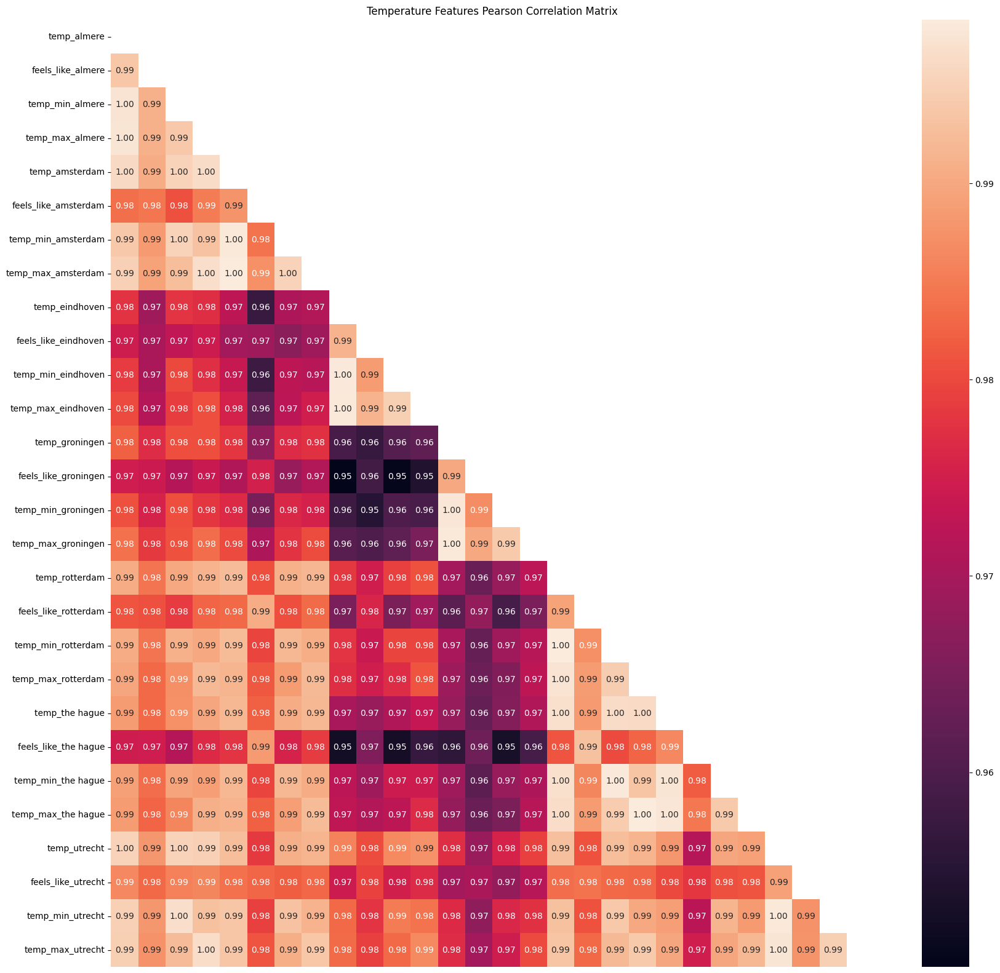

In [37]:
# Investigate correlation of temperature related features

fig, ax = plt.subplots(figsize=(20,20))

cols = []

temp_features = [
    "temp", 
    "feels_like",
    "temp_min",
    "temp_max",
]

for city in w_cities:
    cols.extend([f"{feat}_{city}" for feat in temp_features if f"{feat}_{city}" in df_w_train_wide.columns])

correlations = df_w_train_wide[cols].corr(method='pearson')
matrix = np.triu(correlations)
sns.heatmap(correlations, 
            annot=True, 
            fmt='.2f',
            mask=matrix)
ax.set_title(f'Temperature Features Pearson Correlation Matrix')
ax.set_xticks([])

plt.show()

As suspected temperature features are highly correlated. Will create a temperature range feature from temp_min and temp_max and then drop temp_min, temp_max and feels_like

In [111]:
fl_features = [f"feels_like_{city}" for city in w_cities if f"feels_like_{city}" in df_w_train_wide.columns]
tmin_features = [f"temp_min_{city}" for city in w_cities if f"temp_min_{city}" in df_w_train_wide.columns]
tmax_features = [f"temp_max_{city}" for city in w_cities if f"temp_max_{city}" in df_w_train_wide.columns]

df_temp_range = df_w_train_wide[tmax_features].sub(df_w_train_wide[tmin_features].rename(columns=dict(zip(tmin_features, tmax_features))))
df_temp_range.columns = [col.replace("temp_max", "temp_rng") for col in df_temp_range.columns]
df_w_train_wide = df_w_train_wide.drop(fl_features + tmin_features + tmax_features, axis=1)  
df_w_train_wide = pd.merge(df_w_train_wide, df_temp_range, how='left', left_index=True, right_index=True)

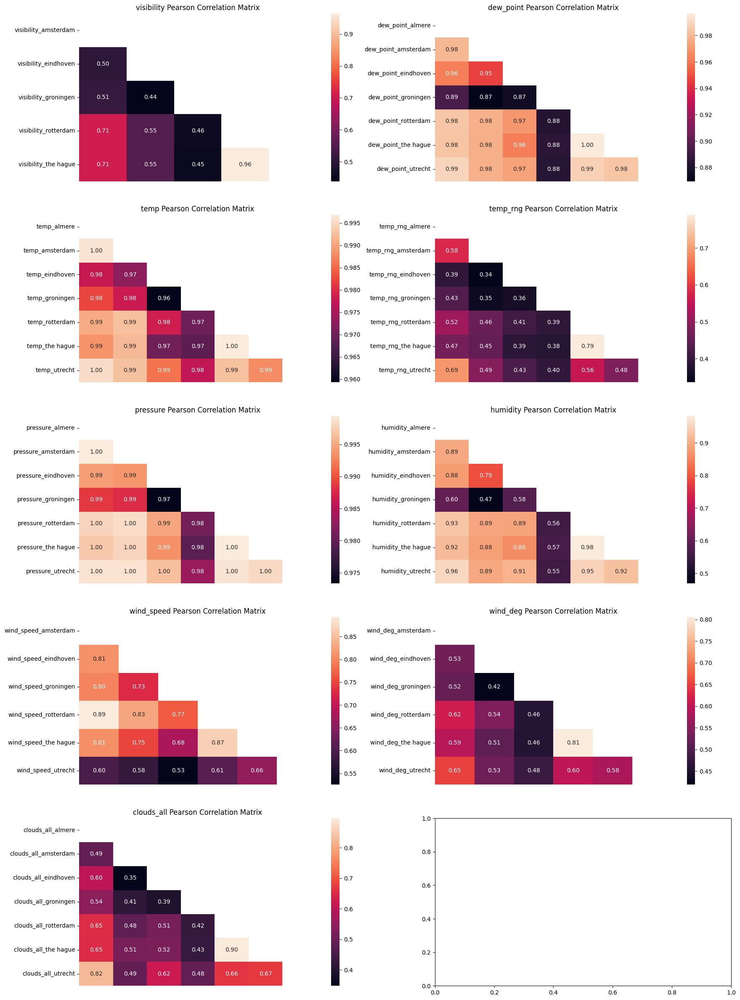

In [39]:
# Investigate correlation of all weather features

w_features = [
    "visibility",
    "dew_point",
    "temp",
    "temp_rng",
    "pressure",
    "humidity",
    "wind_speed",
    "wind_deg",
    "clouds_all"
]

fig, axs = plt.subplots(ceil(len(w_features)/2), 2, figsize=(20,30))

for i, feat in enumerate(w_features):
    cols = [f"{feat}_{city}" for city in w_cities if f"{feat}_{city}" in df_w_train_wide.columns]
    correlations = df_w_train_wide[cols].corr(method='pearson')
    matrix = np.triu(correlations)
    sns.heatmap(correlations, 
                annot=True, 
                fmt='.2f',
                mask=matrix,
                ax=axs[i // 2, i % 2])
    axs[i // 2, i % 2].set_title(f'{feat} Pearson Correlation Matrix')
    axs[i // 2, i % 2].set_xticks([])

plt.show()

Is is not suprising that the same features measured in different cities in the Netherlands are highly correlated. Will create a single feature for the features dew_point, temp, pressure, humidity, wind_speed. Will use the electricty consumption per
as weights. this data was retrieved here https://www.kaggle.com/datasets/lucabasa/dutch-energy

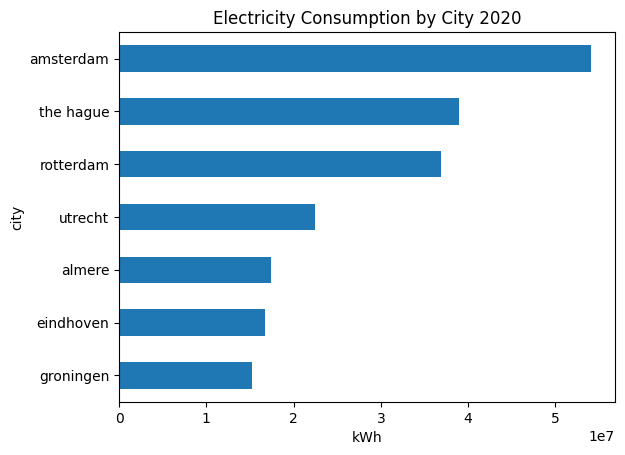

In [112]:
path = ".\\data\\Electricity"

onlyfiles = [join(path, f) for f in listdir(path) if isfile(join(path, f)) and ('2020' in f)]

df_en = []

for f in onlyfiles:
    df_en.append(pd.read_csv(f))

df_en = pd.concat(df_en, ignore_index=True)
df_en['city'] = df_en['city'].str.lower()
df_en = df_en.groupby('city')['annual_consume'].sum().sort_values(ascending=False)
df_en = df_en.rename(index={"'s-gravenhage":"the hague"})
df_en = df_en[w_cities]
dict_en = df_en.to_dict()

df_en.sort_values().plot.barh(title='Electricity Consumption by City 2020', xlabel='kWh')
plt.show()

In [113]:
data_w_train_weighted = []
weighted_cols = []
col_2_remove = []
n_w_train_wide = len(df_w_train_wide)
corr_w_features = [
    "dew_point",
    "temp",
    "pressure",
    "humidity",
    "wind_speed",
]

for feature in corr_w_features:
    temp_weighted = 0.0
    total_weight = 0.0
    for city in w_cities:
        if f"{feature}_{city}" in df_w_train_wide.columns:
            col_2_remove.append(f"{feature}_{city}")
            weight = dict_en[city]
            total_weight += weight
            temp_weighted += weight * df_w_train_wide[f"{feature}_{city}"]
    temp_weighted = temp_weighted / total_weight
    df_w_train_wide[f"{feature}_weighted"] = temp_weighted
    weighted_cols.append(f"{feature}_weighted")

df_w_train_wide = df_w_train_wide.drop(col_2_remove, axis=1)

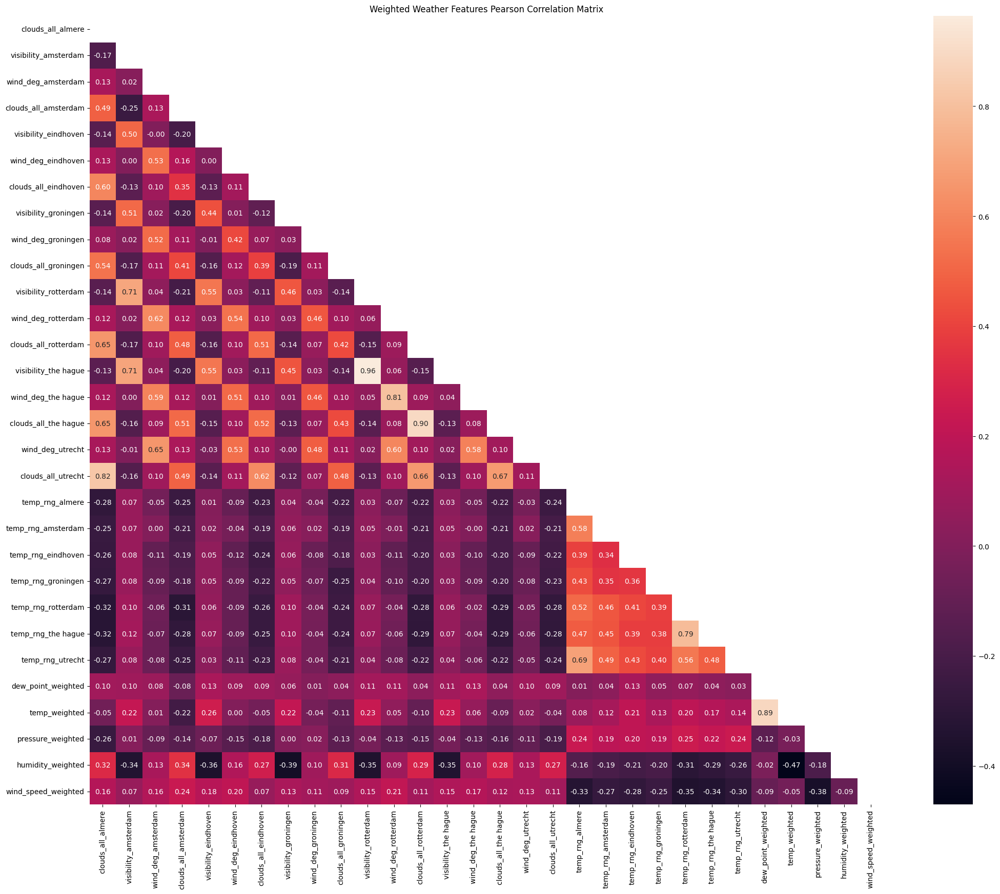

In [42]:
fig, ax = plt.subplots(figsize=(25, 20))

correlations = df_w_train_wide.corr(method='pearson')
matrix = np.triu(correlations)
sns.heatmap(correlations, 
            annot=True, 
            fmt='.2f',
            mask=matrix)
ax.set_title(f'Weighted Weather Features Pearson Correlation Matrix')

plt.show()

Most of the highly correlated weather features have been removed

In [114]:
w_features = df_w_train_wide.columns
df_train = pd.merge(df_train, df_w_train_wide, how='left', left_index=True, right_index=True)

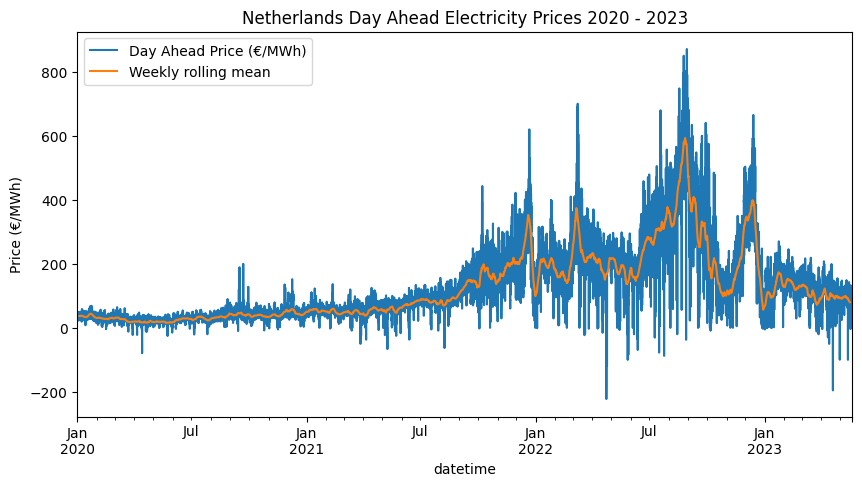

In [44]:
# Plot the hourly day ahead electricity price, along with the weekly rolling mean

fig, ax = plt.subplots(figsize=(10, 5))

df_train["day_ahead_prices"].plot(ax=ax, 
                                  title='Netherlands Day Ahead Electricity Prices 2020 - 2023',  
                                  label='Day Ahead Price (€/MWh)',
                                  ylabel='Price (€/MWh)')
df_train["day_ahead_prices"].rolling(24*7, center=True).mean().plot(ax=ax,  
                                                                    label='Weekly rolling mean')
ax.legend()
plt.show()


In [45]:
prices = df_train.reset_index().copy()
prices = prices[["datetime", "day_ahead_prices"]].copy()
prices["year"] = prices["datetime"].dt.year
prices["month"] = prices["datetime"].dt.month
prices["day_of_week"] = prices["datetime"].dt.day_name()
prices["hour_of_day"] = prices["datetime"].dt.hour

In [46]:
px.box(prices, x="year", y="day_ahead_prices" , color = "month", title = "Netherlands Day Ahead Electricity Prices by Year and Month")

In [47]:
px.box(prices, x="year", y="day_ahead_prices" , color = "day_of_week", title = "Netherlands Day Ahead Electricity Prices by Year and Day of Week",
      category_orders={"day_of_week": ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]})

In [48]:
px.box(prices, x="year", y="day_ahead_prices" , color = "hour_of_day", title = "Netherlands Day Ahead Electricity Prices by Year and Hour of Day")

In [49]:
df_tmp = generate_calendar_features(prices)

# Apply A/B Testing
h_cols =  df_tmp.columns[df_tmp.columns.str.startswith("holiday")].tolist()
ab = []
for i in h_cols:
    ab.append(AB_Test(df_tmp, group = i, target = "day_ahead_prices"))
ab = pd.concat(ab, ignore_index=True)
ab.to_csv('results\\2020_2023_holiday_ab_test_nl.csv',index=False)
ab.round(2)

Adding Calendar Features


,Feature,Test Type,AB Hypothesis,p-value,Comment,GroupA_mean,GroupB_mean,GroupA_median,GroupB_median
0,holiday_Bevrijdingsdag,Non-Parametric,Reject H0,0.00,A/B groups are not similar,20.38,89.40,19.76,70.73
1,holiday_Eerste Kerstdag,Non-Parametric,Reject H0,0.00,A/B groups are not similar,116.52,186.58,111.10,171.12
2,holiday_Eerste Pinksterdag,Non-Parametric,Reject H0,0.00,A/B groups are not similar,61.34,89.40,26.21,70.73
3,holiday_Eerste paasdag,Non-Parametric,Reject H0,0.00,A/B groups are not similar,61.13,94.29,39.06,69.92
4,holiday_Hemelvaartsdag,Non-Parametric,Reject H0,0.01,A/B groups are not similar,64.38,89.40,60.80,70.73
5,holiday_Koningsdag,Non-Parametric,Fail to Reject H0,0.61,A/B groups are similar,98.44,94.29,72.80,69.92
6,holiday_Nieuwjaarsdag,Non-Parametric,Reject H0,0.00,A/B groups are not similar,49.03,103.26,42.77,66.39
7,holiday_Tweede Kerstdag,Non-Parametric,Reject H0,0.00,A/B groups are not similar,99.99,186.58,71.94,171.12
8,holiday_Tweede Pinksterdag,Non-Parametric,Reject H0,0.00,A/B groups are not similar,48.66,105.18,22.77,75.59
9,holiday_Tweede paasdag,Non-Parametric,Reject H0,0.00,A/B groups are not similar,46.14,94.29,25.79,69.92


The above AB test compares the distribution of energy prices on the different Dutch Public holidays vs Non-Public holidays in the same month of the year. As can be seen in the plot of prices above, there was high variation in electricity prices from 2020-2024 which would effect this analysis. To confirm that the prices on these holiday days are indeed different from those on non-holidays, I will perform the same analysis for prices from 2016-2019 

In [50]:
df_name = "day_ahead_prices"
df_tmp = pd.read_csv(f".\\data\\{df_name}_NL_2.csv") 
df_tmp["datetime"] = pd.to_datetime(df_tmp["datetime"], utc=True).dt.tz_localize(None)
df_tmp = df_tmp.sort_values('datetime')
df_tmp = clean_en_data(df_tmp, df_name)
df_tmp = df_tmp.reset_index()
df_tmp = df_tmp[df_tmp.datetime.dt.date < date(2020, 1, 1)]
df_tmp = generate_calendar_features(df_tmp)

# Apply A/B Testing
h_cols =  df_tmp.columns[df_tmp.columns.str.startswith("holiday")].tolist()
ab = []
for i in h_cols:
    ab.append(AB_Test(df_tmp, group = i, target = "day_ahead_prices"))
ab = pd.concat(ab, ignore_index=True)
ab.to_csv('results\\2016_2019_holiday_ab_test_nl.csv',index=False)
ab.round(2)

Adding Calendar Features


,Feature,Test Type,AB Hypothesis,p-value,Comment,GroupA_mean,GroupB_mean,GroupA_median,GroupB_median
0,holiday_Eerste Kerstdag,Non-Parametric,Reject H0,0.00,A/B groups are not similar,38.82,47.17,35.02,44.89
1,holiday_Eerste Pinksterdag,Non-Parametric,Reject H0,0.00,A/B groups are not similar,30.78,37.80,27.62,36.34
2,holiday_Eerste paasdag,Non-Parametric,Reject H0,0.00,A/B groups are not similar,31.15,38.61,32.32,36.66
3,holiday_Hemelvaartsdag,Non-Parametric,Reject H0,0.00,A/B groups are not similar,30.67,37.80,28.76,36.34
4,holiday_Koningsdag,Non-Parametric,Fail to Reject H0,0.59,A/B groups are similar,34.94,35.28,33.54,34.95
5,holiday_Nieuwjaarsdag,Non-Parametric,Reject H0,0.00,A/B groups are not similar,37.71,45.09,35.17,41.96
6,holiday_Tweede Kerstdag,Non-Parametric,Reject H0,0.00,A/B groups are not similar,42.62,47.17,37.47,44.89
7,holiday_Tweede Pinksterdag,Non-Parametric,Reject H0,0.00,A/B groups are not similar,31.59,37.80,29.78,36.34
8,holiday_Tweede paasdag,Non-Parametric,Reject H0,0.00,A/B groups are not similar,30.95,38.61,30.08,36.66


The results on the AB test for 2020-2024 are confirmed with the 2016 to 2019 data. As a result I will include dummy variables for all holidays except Koningsdag. Additionally I will not include a dummy variable for Bevrijdingsdag as this is only a public holiday once every 5 years.

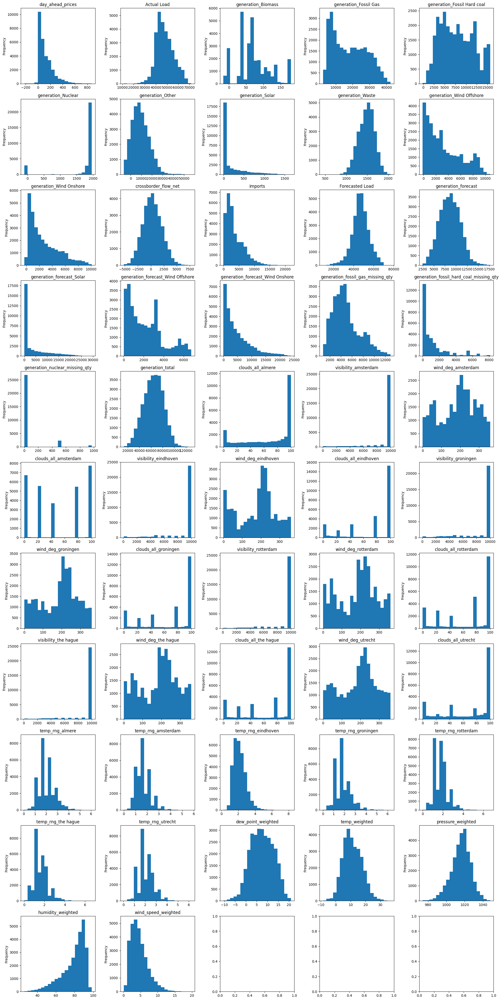

In [51]:
n_feat = df_train.shape[1]

# Checking histograms of numerical features
fig, axs = plt.subplots(ceil(n_feat / 5), 5, figsize=(20, 40))
for i, col in enumerate(df_train.columns):
    df_train[col].plot(kind='hist', bins=20, title=col, ax=axs[i // 5, i % 5])
    
plt.tight_layout()

Main takeaways:
    
1. A small number of features that look normally distributed, such as: crossborder_flow_net, generation_total, dew_point_weighted
2. Several features are heavily skewed, such as: day_ahead_prices, Actual Load, generation_Other, generation_Solar, generation_waste, generation_Wind*, imports, generation_fossil_gas_missing_qty, generation_fossil_hard_coal_missing_qty, pressure weighted, humidity_weighted, wind_speed_weighted
3. Several features are bi- or multimodel, such as: generation_Fossil Gas, generation_Nuclear, generation_fossil_hard_coal_missing_qty, generation_nuclear_missing_qty, clouds_all*, visibility*, wind_deg*
4. Some of the features do not look continuous, such as: clouds_all_amsterdam, clouds_all_eindhoven

In [52]:
data_adfuller = []
for col in df_train.columns:
    temp_d = {}
    data = df_train[col].values
    result = adfuller(data)
    temp_d['Series Name'] = col
    temp_d['ADF Statistic'] = result[0]
    temp_d['p-value'] = result[1]
    data_adfuller.append(temp_d)
    
df_adfuller = pd.DataFrame(data_adfuller)

In [53]:
df_adfuller

,Series Name,ADF Statistic,p-value
0,day_ahead_prices,-5.245712,7.086858e-06
1,Actual Load,-12.153872,1.548007e-22
2,generation_Biomass,-6.312725,3.205159e-08
3,generation_Fossil Gas,-14.397957,8.604073e-27
4,generation_Fossil Hard coal,-8.196251,7.435774e-13
5,generation_Nuclear,-6.121897,8.814407e-08
6,generation_Other,-9.151577,2.677667e-15
7,generation_Solar,-6.786283,2.427543e-09
8,generation_Waste,-8.351629,2.983891e-13
9,generation_Wind Offshore,-13.584378,2.094111e-25


All features reject the null hypothesis of non stationarity except for clouds_all*

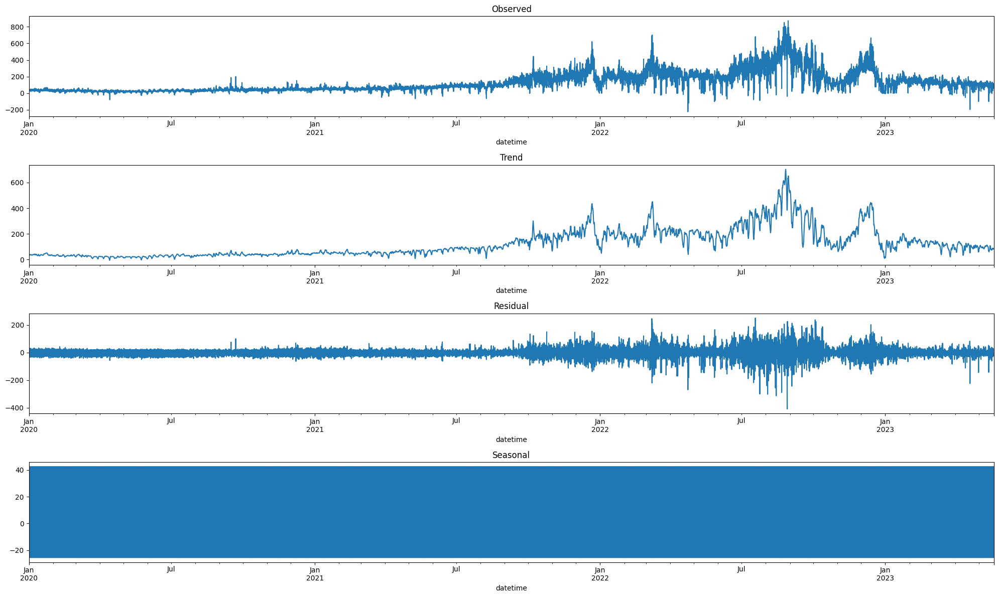

In [54]:
sd = sm.tsa.seasonal_decompose(df_train['day_ahead_prices'], model='additive')
fig, axs = plt.subplots(4, 1, figsize=(20, 12))

sd.observed.plot(ax=axs[0], title='Observed')
sd.trend.plot(ax=axs[1], title='Trend')
sd.resid.plot(ax=axs[2], title='Residual')
sd.seasonal.plot(ax=axs[3], title='Seasonal')
plt.tight_layout()
plt.show()

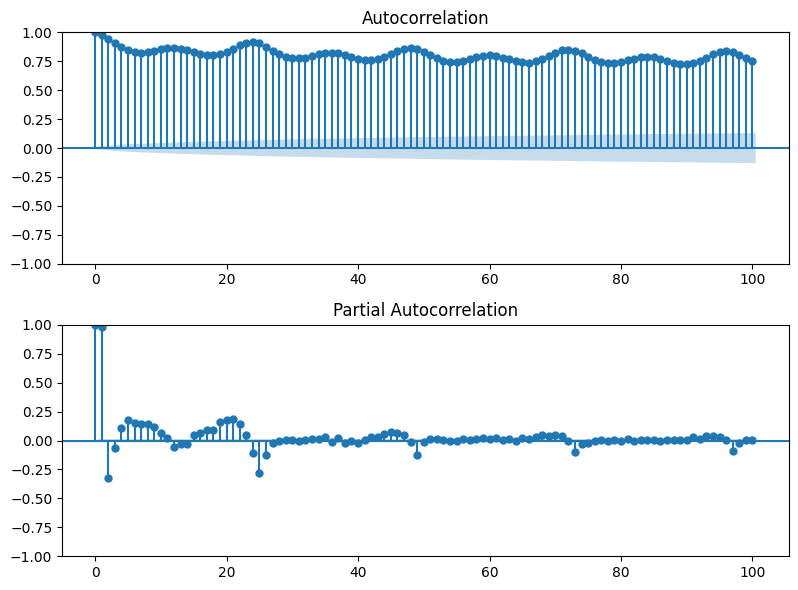

In [127]:
# Plot autocorrelation and partial autocorrelation plots

fig, axs = plt.subplots(2, 1, figsize=(8, 6))
plot_acf(df_train['day_ahead_prices'], lags=100, ax=axs[0])
plot_pacf(df_train['day_ahead_prices'], lags=100, ax=axs[1])
plt.tight_layout()
plt.show()

Partial autocorrelation plot dispalys daily seasonality with significant lags at multiples of 24

In [115]:
# Negatively shift prices by 48hours so we forecast 48 hours into the future
print("Adding leading day_ahead_returns as target")
df_train['day_ahead_prices_lead_48'] = df_train['day_ahead_prices'].shift(-48)
df_train = df_train.dropna()
en_features.remove('day_ahead_prices')

Adding leading day_ahead_returns as target


Day ahead prices are released for the next day at 12:00 UTC, so I will forecast prices 48 hours into the future so that I have forcast of one full day of prices before the actual values are released. I reflect this in the data by generating a new leading variable 'day_ahead_prices_lead_48' and removing 'day_ahead_prices'

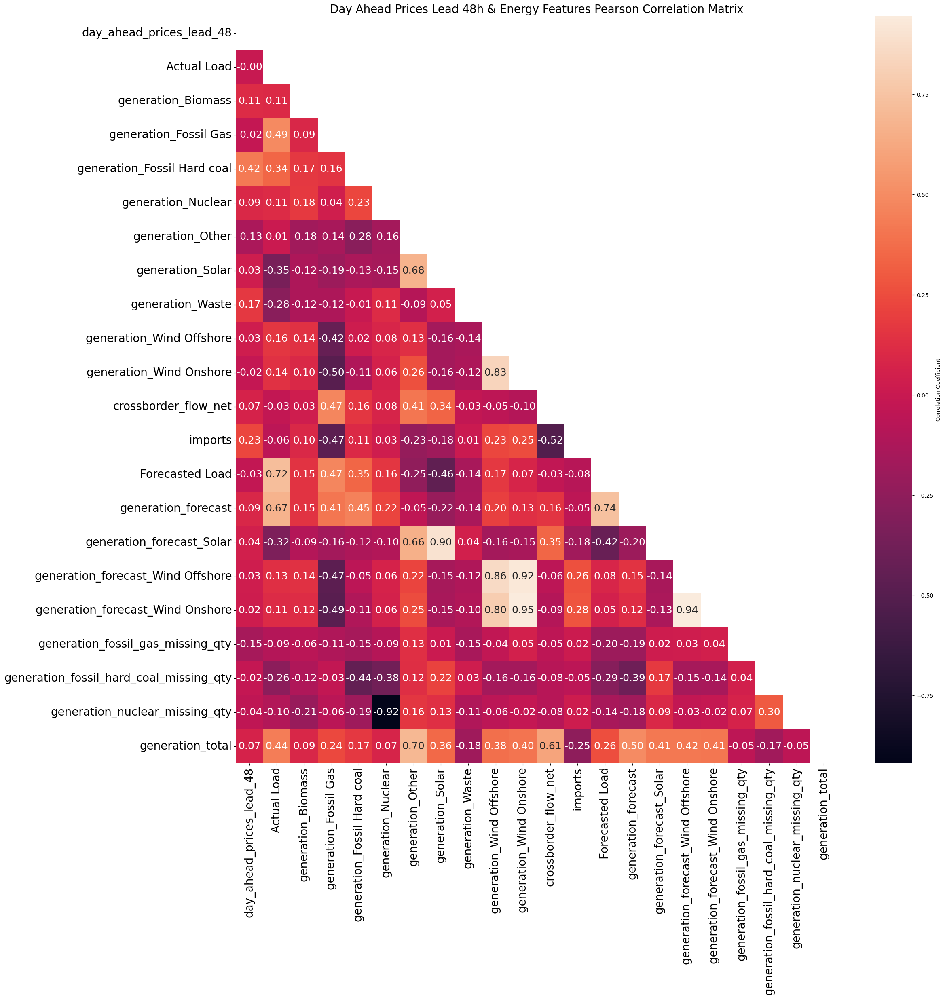

In [57]:
correlations = df_train[['day_ahead_prices_lead_48'] + en_features].corr(method='pearson')
fig = plt.figure(figsize=(24, 24))
matrix = np.triu(correlations)
# sns.heatmap(correlations, 
#             annot=True, 
#             fmt='.2f',
#             mask=matrix,
#            annot_kws={"size": 14})
# sns.set(font_scale=2.0)
# plt.title('Day Ahead Prices & Energy Fatures Pearson Correlation Matrix')
# plt.show()
sns.heatmap(correlations, 
            annot=True, 
            fmt='.2f',
            mask=matrix,
            annot_kws={"size": 18},
            cbar_kws={'label': 'Correlation Coefficient'},
            yticklabels=1,  # Ensure all labels are shown
            xticklabels=1)  # Ensure all labels are shown

plt.title('Day Ahead Prices Lead 48h & Energy Features Pearson Correlation Matrix', fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.show()

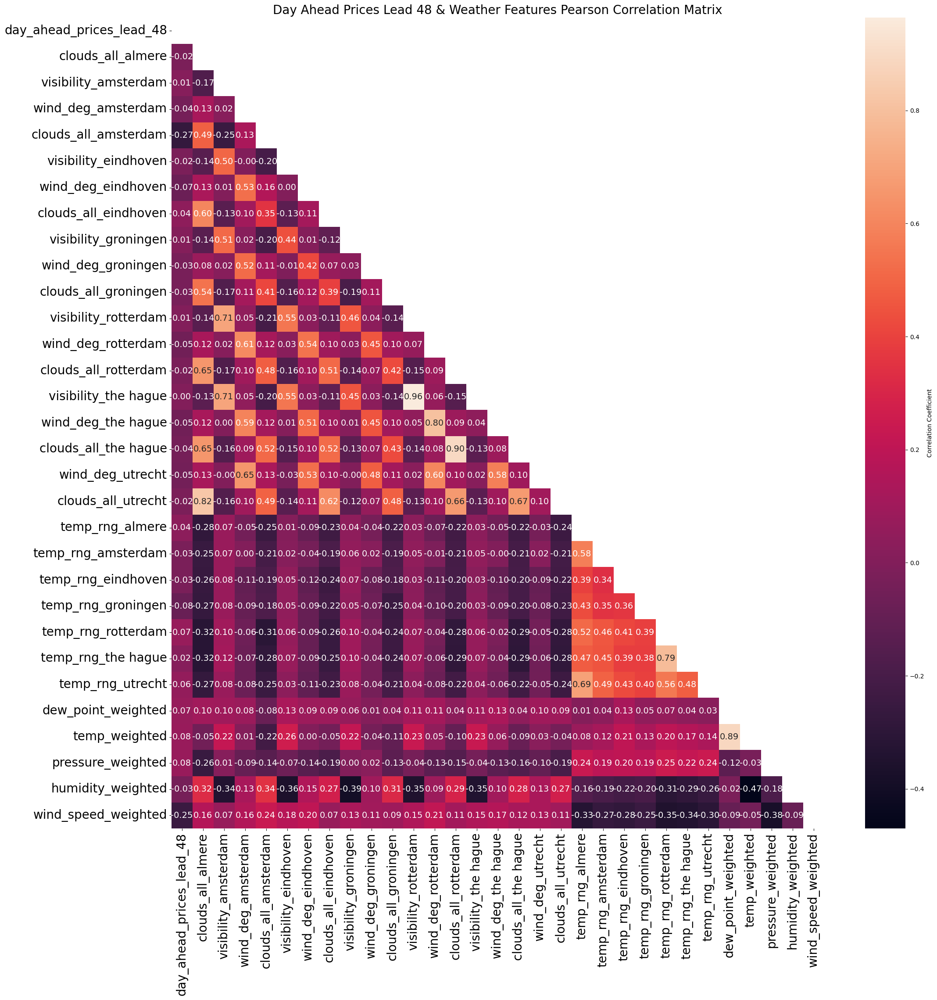

In [58]:
correlations = df_train[['day_ahead_prices_lead_48'] + list(w_features)].corr(method='pearson')
fig = plt.figure(figsize=(24, 24))
matrix = np.triu(correlations)
sns.heatmap(correlations, 
            annot=True, 
            fmt='.2f',
            mask=matrix,
            annot_kws={"size": 14},
            cbar_kws={'label': 'Correlation Coefficient'},
            yticklabels=1,  # Ensure all labels are shown
            xticklabels=1)  # Ensure all labels are shown

plt.title('Day Ahead Prices Lead 48 & Weather Features Pearson Correlation Matrix', fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.show()

Strongest relationship with day_ahead prices is wind_speed_weighted

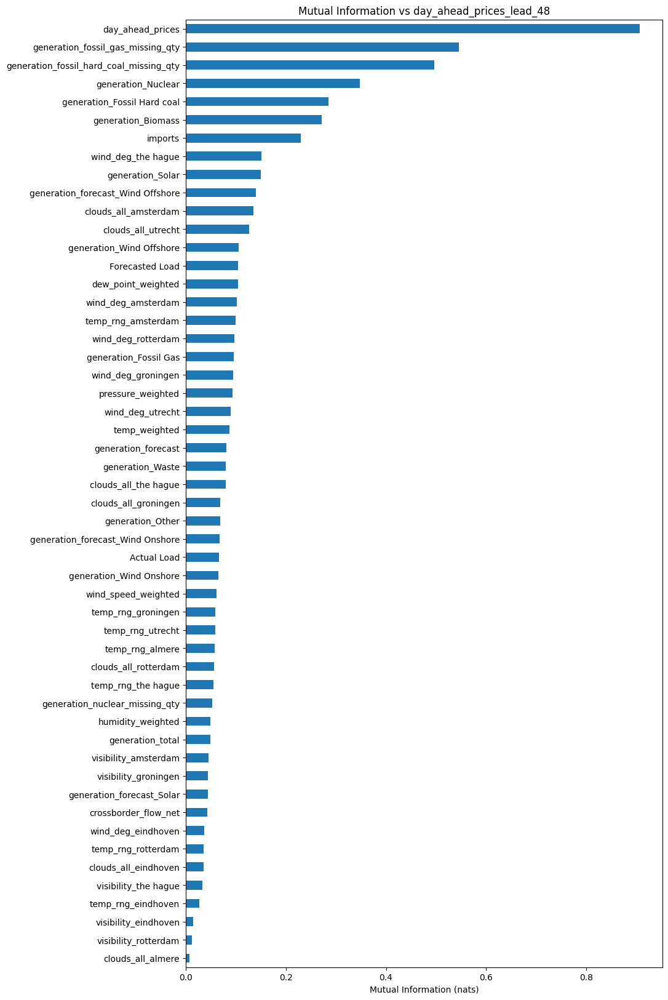

In [116]:
target_name = 'day_ahead_prices_lead_48'
covariate_names = df_train.columns.to_list()
covariate_names.remove(target_name)

df_y = df_train[target_name].copy()
df_X = df_train[covariate_names].copy()

mutual_info = mutual_info_regression(df_X, df_y)
mutual_info = pd.Series(mutual_info)
mutual_info.index = df_X.columns
mutual_info = mutual_info.sort_values(ascending=False)

mutual_info.sort_values(ascending=True).plot.barh(figsize=(10, 20),
                                                  title='Mutual Information vs day_ahead_prices_lead_48', 
                                                  xlabel='Mutual Information (nats)')
plt.show()

In [117]:
target_name = 'day_ahead_prices_lead_48'
covariate_names = df_train.columns.to_list()

covariates_2_remove = [
    target_name,
    'clouds_all_almere',
    'clouds_all_eindhoven',
    'clouds_all_groningen',
    'clouds_all_rotterdam',
    'clouds_all_the hague',
    'clouds_all_utrecht',
    'temp_rng_almere',
    'temp_rng_eindhoven',
    'temp_rng_groningen',
    'temp_rng_rotterdam',
    'temp_rng_the hague',
    'temp_rng_utrecht',
    'visibility_amsterdam',
    'visibility_eindhoven',
    'visibility_groningen',
    'visibility_rotterdam',
    'visibility_the hague',
    'wind_deg_amsterdam',
    'wind_deg_eindhoven',
    'wind_deg_groningen',
    'wind_deg_rotterdam',
    'wind_deg_the hague',
    'wind_deg_utrecht',
]

for feature in covariates_2_remove:
    covariate_names.remove(feature)

lags = [1, 2, 3, 4] + [24 * i for i in range(1, 8)]
df_temp = generate_lagged_features(df_train.copy(), covariate_names, lags)
df_temp = df_temp.dropna()

covariate_names = df_temp.columns.to_list()
for feature in covariates_2_remove:
    covariate_names.remove(feature)

df_y = df_temp[target_name].copy()
df_X = df_temp[covariate_names].copy()

mutual_info = mutual_info_regression(df_X, df_y)
mutual_info = pd.Series(mutual_info)
mutual_info.index = df_X.columns
mutual_info = mutual_info.sort_values(ascending=False)

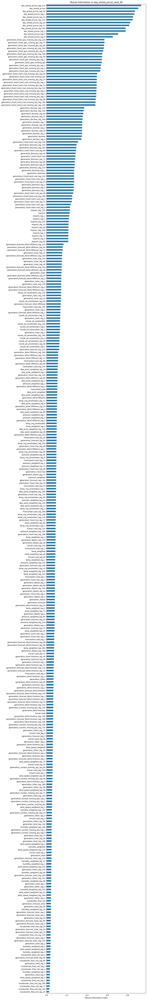

In [118]:
mutual_info.sort_values(ascending=True).plot.barh(figsize=(10, 100),
                                                  title='Mutual Information vs day_ahead_prices_lead_48', 
                                                  xlabel='Mutual Information (nats)')
plt.show()